## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Camera calibration and distortion correction

In [31]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

plt.rcParams['figure.figsize'] = [150, 50]

In [32]:
class CameraDistortion:
    
    mtx_ = None
    dist_ = None
    visualization_ = False
    
    def __init__(self, visualization = False):
        self.visualization_ = visualization
    
    def calibrate(self, images):

        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((6*9,3), np.float32)
        objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        i = 1

        # Step through the list and search for chessboard corners
        for fname in images:
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

            ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)

                # Draw and display the corners
                img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
                
                if self.visualization_:
                    plt.subplot(len(images), 1, i)
                    plt.imshow(img)
                i+=1
        
        img = cv2.imread(images[0])
        ret, self.mtx_, self.dist_, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1],None,None)
    
    def undistort(self, img):
        return cv2.undistort(img, self.mtx_, self.dist_, None, self.mtx_)

In [33]:
plt.rcParams['figure.figsize'] = [300,300]

camera = CameraDistortion(visualization=False)

images = glob.glob('./camera_cal/calibration*.jpg')
camera.calibrate(images)

In [34]:
img = cv2.imread('./camera_cal/calibration1.jpg')
undist = camera.undistort(img)

plt.subplot(2,1,1)
plt.imshow(img)
plt.subplot(2,1,2)
plt.imshow(undist)

cv2.imwrite('./output_images/distorted.jpg', img)
cv2.imwrite('./output_images/undistorted.jpg', undist)

True

## Create a thresholded binary image

In [35]:
class LinePixelDetector:
    
    sobel_thresh_x_ = (20, 100)    
    sobel_thresh_y_ = (20, 100)
    mag_thresh_ = (30, 100)
    dir_thresh_ = (0.7, 1.3)
    hls_thresh_ = (150, 210)
    sobel_kernel_mag_ = 3
    sobel_kernel_dir_ = 15
    
    def abs_sobel_thresh(self, img, orient='x', thresh=(0,255)):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        if orient == 'x':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        elif orient == 'y':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        abs_sobel = np.absolute(sobel)
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        return binary_output

    def mag_thresh(self, img, sobel_kernel=3, thresh=(0, 255)):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        mag = np.sqrt(sobelx**2 + sobely**2)
        scaled_sobel = np.uint8(255*mag/np.max(mag))
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        return binary_output


    def dir_threshold(self, img, sobel_kernel=3, thresh=(0, np.pi/2)):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx)
        abs_sobely = np.absolute(sobely)
        dir = np.arctan2(abs_sobely, abs_sobelx)
        binary_output = np.zeros_like(dir)
        binary_output[(dir >= thresh[0]) & (dir <= thresh[1])] = 1
        return binary_output    

    def gradient_detection(self, img, sobel_thresh_x, sobel_thresh_y, mag_thresh, dir_thresh, sobel_kernel_mag, sobel_kernel_dir):
        gradx = self.abs_sobel_thresh(img, orient='x', thresh=sobel_thresh_x)
        grady = self.abs_sobel_thresh(img, orient='y', thresh=sobel_thresh_y)
        mag_binary = self.mag_thresh(img, sobel_kernel=sobel_kernel_mag, thresh=mag_thresh)
        dir_binary = self.dir_threshold(img, sobel_kernel=sobel_kernel_dir, thresh=dir_thresh)

        combined = np.zeros_like(dir_binary)
        combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        return combined


    def hls_select(self, img, thresh=(0, 255)):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        S = hls[:,:,2]
        binary_output = np.zeros_like(S)
        binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
        return binary_output


    def detect(self, img):
        hls_binary = self.hls_select(img, thresh=self.hls_thresh_)
        g_binary = self.gradient_detection(img, 
                                      sobel_thresh_x = self.sobel_thresh_x_, 
                                      sobel_thresh_y = self.sobel_thresh_y_, 
                                      mag_thresh = self.mag_thresh_, 
                                      dir_thresh = self.dir_thresh_, 
                                      sobel_kernel_mag = self.sobel_kernel_mag_, 
                                      sobel_kernel_dir = self.sobel_kernel_dir_)

        combined_binary = np.zeros_like(g_binary)
        combined_binary[(hls_binary == 1) | (g_binary == 1)] = 1

        return combined_binary

True

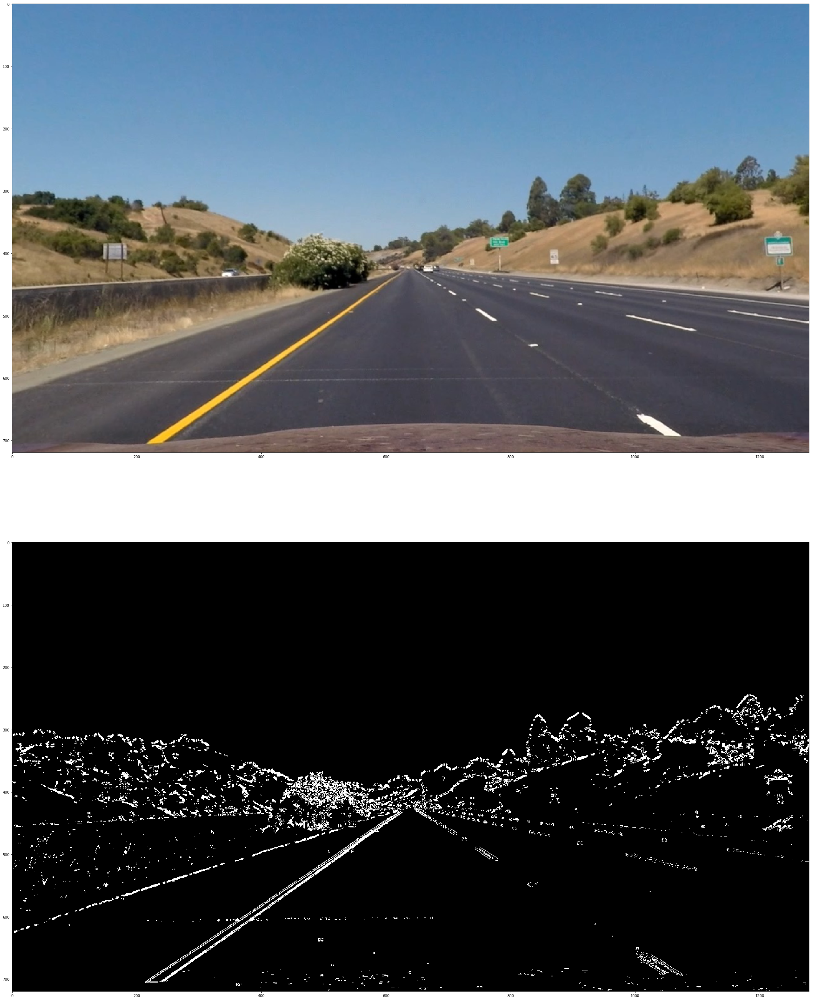

In [36]:
linePixelDetector = LinePixelDetector()

images = glob.glob('./test_images/*.jpg')
img = mpimg.imread(images[0])
undistImg = camera.undistort(img)

plt.rcParams['figure.figsize'] = [150, 50]

lanePixelsImg = linePixelDetector.detect(undistImg)
plt.subplot(2,1,1)
plt.imshow(undistImg)
plt.subplot(2,1,2)
plt.imshow(lanePixelsImg, cmap='gray')
cv2.imwrite('./output_images/roadUndist.jpg', cv2.cvtColor(undistImg, cv2.COLOR_RGB2BGR))
cv2.imwrite('./output_images/roadBinary.jpg',  np.uint8(255*lanePixelsImg/np.max(lanePixelsImg)))

## Birds-eye view

In [37]:
class ViewTransformer:    
    src = np.float32([[243, 685], [578, 460], [704, 460], [1062, 685]])
    dst = np.float32([[243, 720], [243, 0], [1062,0], [1062, 720]])
    
    def __init__(self):
        self.M = cv2.getPerspectiveTransform(self.src, self.dst)
        self.Minv = cv2.getPerspectiveTransform(self.dst, self.src)

    def standardToBird(self, img):
        return cv2.warpPerspective(img, self.M, img.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    def birdToStandard(self, img):
        return cv2.warpPerspective(img, self.Minv, img.shape[1::-1], flags=cv2.INTER_LINEAR)

True

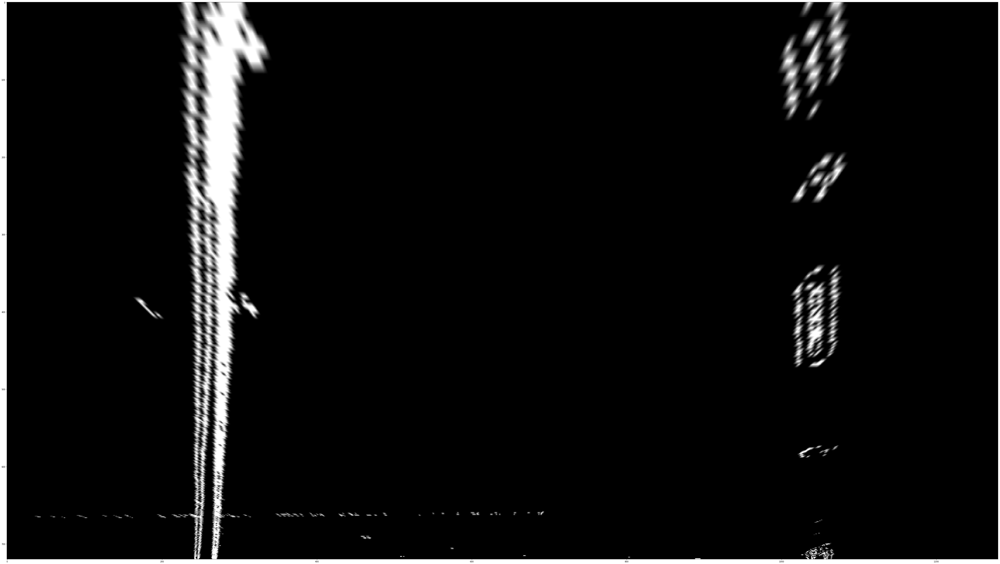

In [38]:
transformer = ViewTransformer()
transLanePixelsImg = transformer.standardToBird(lanePixelsImg)

plt.imshow(transLanePixelsImg, cmap='gray')
cv2.imwrite('./output_images/roadBinaryTransformed.jpg',  np.uint8(255*transLanePixelsImg/np.max(transLanePixelsImg)))

## Detect lane pixels

In [39]:
class Line:
    def __init__(self):
        self.detected = False  
        
        self.lastDetection = 0
        self.lastDetectionThreshold = 5
        self.currentFit = [] 
        self.fitThreshold = [0.0005, 0.5, 100.0]



In [40]:
class LineDetector:
    
    def __init__(self, usePrior=False):
        self.usePrior_ = usePrior
        self.rightLine = Line()
        self.leftLine = Line()
    
    def findLinePixelsPrior(self, binary_warped, left_fit, right_fit):
        # Choose the width of the margin around the previous polynomial to search
        margin = 100

        # Grab activated pixels
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        left_lane_inds = []
        for i in range(len(nonzeroy)):
            x_dest = left_fit[0]*nonzeroy[i]**2 + left_fit[1]*nonzeroy[i] + left_fit[2]
            if abs(x_dest - nonzerox[i]) < 100:
                left_lane_inds.append(i)

        right_lane_inds = []
        for i in range(len(nonzeroy)):
            x_dest = right_fit[0]*nonzeroy[i]**2 + right_fit[1]*nonzeroy[i] + right_fit[2]
            if abs(x_dest - nonzerox[i]) < 100:
                right_lane_inds.append(i)

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit new polynomials
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        

        return leftx, lefty, rightx, righty, left_fit, right_fit

    def findLinePixels(self, binary_warped):
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # Create an output image to draw on and visualize the result
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]//2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50

        # Set height of windows - based on nwindows above and image shape
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated later for each window in nwindows
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current-margin
            win_xleft_high = leftx_current+margin  
            win_xright_low = rightx_current-margin  
            win_xright_high = rightx_current+margin  

            good_left_inds =np.argwhere(binary_warped[win_y_low:win_y_high, win_xleft_low:win_xleft_high]>0)
            good_right_inds = np.argwhere(binary_warped[win_y_low:win_y_high, win_xright_low:win_xright_high]>0)
            good_left_inds[:,1] += win_xleft_low
            good_left_inds[:,0] += win_y_low
            good_right_inds[:,1] += win_xright_low
            good_right_inds[:,0] += win_y_low

            good_left_inds = np.argwhere((win_xleft_low<=nonzerox)&(nonzerox<win_xleft_high)&
            (win_y_low<=nonzeroy)&(nonzeroy<win_y_high))
            good_right_inds = np.argwhere((win_xright_low<=nonzerox)&(nonzerox<win_xright_high)&
            (win_y_low<=nonzeroy)&(nonzeroy<win_y_high))

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            if len(good_left_inds) > minpix:
                leftx_current = np.mean(nonzerox[good_left_inds], dtype=np.int32)
            if len(good_right_inds) > minpix:
                rightx_current = np.mean(nonzerox[good_right_inds], dtype=np.int32)

        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        left_fit = np.polyfit(lefty[:,0], leftx[:,0], deg=2)
        right_fit = np.polyfit(righty[:,0], rightx[:,0], deg=2)

        return leftx, lefty, rightx, righty, left_fit, right_fit
    
    def drawRoadArea(self, img, leftx, lefty, rightx, righty, left_fit, right_fit):
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        area = np.zeros_like(img)
        
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        
        area = cv2.fillPoly(area, np.int_([pts]), (0,255, 0))
        
        out_img = cv2.addWeighted(area, 0.5, img, 0.5, 0.0)
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]
        return out_img
    
    def checkLine(self, line, newFit):
        diff = abs(line.currentFit - newFit)
        if (diff[0] < line.fitThreshold[0]) and (diff[1] < line.fitThreshold[1]) and (diff[2] < line.fitThreshold[2]):
            return True
        else:
            return False
        
    
    def updateDetection(self, line, fit):
        if self.checkLine(line, fit):
            line.currentFit = line.currentFit*0.75+fit*0.25
            line.lastDetection = 0
            line.detected = True
        else:
            line.lastDetection += 1
            if line.lastDetection > line.lastDetectionThreshold:
                line.detected = False
        
    
    
    def findLines(self,img):
        imgNormal = np.uint8(255*img/np.max(img))
        result_img = np.dstack((imgNormal, imgNormal, imgNormal))
        logMsg = ''
        if self.usePrior_:
            
            if self.rightLine.detected and self.leftLine.detected:         
                leftx, lefty, rightx, righty, left_fit, right_fit = self.findLinePixelsPrior(img, self.leftLine.currentFit, self.rightLine.currentFit)
                
                self.updateDetection(self.leftLine, left_fit)
                self.updateDetection(self.rightLine, right_fit)
                    
            else:
                logMsg = 'Prior line lost. Looking for new ones'

                leftx, lefty, rightx, righty, left_fit, right_fit = self.findLinePixels(imgNormal)

                self.leftLine.currentFit = left_fit
                self.leftLine.lastDetection = 0
                self.leftLine.detected = True
                
                self.rightLine.currentFit = right_fit
                self.rightLine.lastDetection = 0
                self.rightLine.detected = True
        else:
            leftx, lefty, rightx, righty, left_fit, right_fit = self.findLinePixels(imgNormal)
            self.leftLine.currentFit = left_fit
            self.rightLine.currentFit = right_fit
                
            
        
        result_img = self.drawRoadArea(result_img, leftx, lefty, rightx, righty, self.leftLine.currentFit, self.rightLine.currentFit)
        
        return self.leftLine.currentFit, self.rightLine.currentFit, result_img, logMsg

True

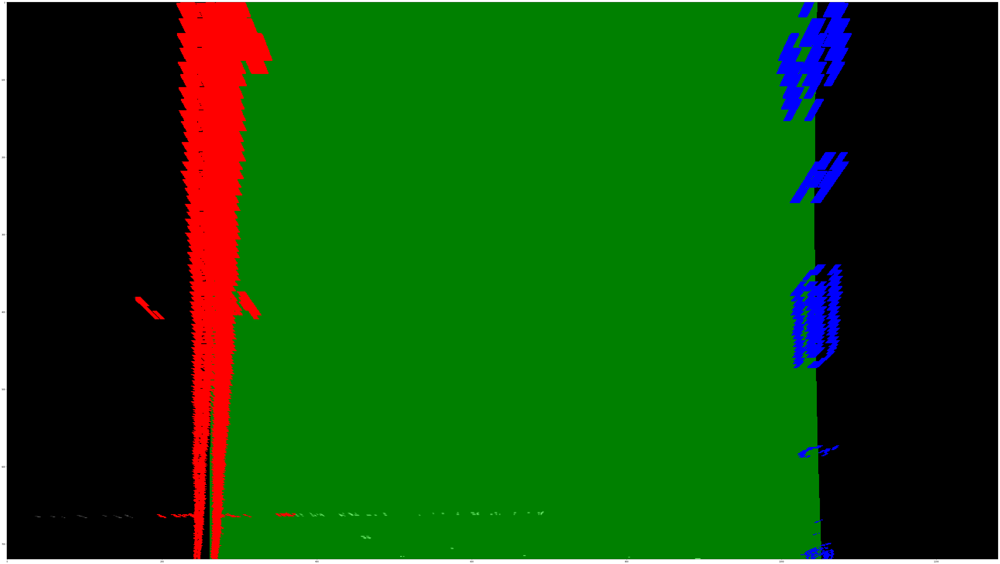

In [41]:
lineDetector = LineDetector()

left_fit, right_fit, detectedLinesImg, msg = lineDetector.findLines(transLanePixelsImg)

plt.imshow(detectedLinesImg)
cv2.imwrite('./output_images/detectedLines.jpg', detectedLinesImg)


## Lane curvature

In [42]:
class LineMeasurments:
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/790 # meters per pixel in x dimension
    
    def __init__(self, imgShape):
        self.centerX = imgShape[1]/2
        self.maxY = imgShape[0]
    
    def measureCurvature(self, left_fit, right_fit):
        '''
        Calculates the curvature of polynomial functions in meters.
        '''
        ploty = np.linspace(0, self.maxY-1, num=self.maxY)
        y_eval_m = np.max(ploty)*self.ym_per_pix
        
        left_fit_m = np.array([left_fit[0]/self.ym_per_pix**2, left_fit[1]/self.ym_per_pix, left_fit[2]])*self.xm_per_pix
        right_fit_m = np.array([right_fit[0]/self.ym_per_pix**2, right_fit[1]/self.ym_per_pix, right_fit[2]])*self.xm_per_pix        
        
        left_curverad = ((1+(2*left_fit_m[0]*y_eval_m+left_fit_m[1])**2)**(3/2))/abs(2*(left_fit_m[0]))
        right_curverad = ((1+(2*right_fit_m[0]*y_eval_m+right_fit_m[1])**2)**(3/2))/abs(2*(right_fit_m[0])) 

        return (left_curverad+right_curverad)/2
    
    def measureCarPosition(self, left_fit, right_fit):
        y = self.maxY
        left_fitx = left_fit[0]*y**2 + left_fit[1]*y + left_fit[2]
        right_fitx = right_fit[0]*y**2 + right_fit[1]*y + right_fit[2]
        linesCenter = (right_fitx+left_fitx)/2

        car_position = self.centerX - linesCenter
        return car_position*self.xm_per_pix

In [43]:
img = mpimg.imread(images[0])
measure = LineMeasurments(img.shape)
curvature = measure.measureCurvature(left_fit, right_fit)
print('Curvature: ', int(curvature), 'm')

car_position_m =  measure.measureCarPosition(left_fit, right_fit)
print('Car position relative to image center: ', car_position_m, 'm')

Curvature:  6701 m
Car position relative to image center:  -0.0801015997411 m


## Create ouput image with detected lines, curvature and position information

In [44]:
class AdvancedLaneDetector:
    def __init__(self, usePrior=False):
        self.camera = CameraDistortion(visualization=False)

        images = glob.glob('./camera_cal/calibration*.jpg')
        self.camera.calibrate(images)
        
        self.linePixelDetector = LinePixelDetector()  
        self.transformer = ViewTransformer()
        self.lineDetector = LineDetector(usePrior)
        
        img = mpimg.imread(images[0])
        self.measure = LineMeasurments(img.shape)
        
    def process(self, img):
        undistImg = self.camera.undistort(img)
        lanePixelsImg = self.linePixelDetector.detect(undistImg)
        transLanePixelsImg = self.transformer.standardToBird(lanePixelsImg)
        left_fit, right_fit, detectedLanesImg, logMsg = self.lineDetector.findLines(transLanePixelsImg)
        detectedLanesImgUnwarped = self.transformer.birdToStandard(detectedLanesImg)
        
        curvature = self.measure.measureCurvature(left_fit, right_fit)
        car_position_m =  self.measure.measureCarPosition(left_fit, right_fit)
        
        combined = np.zeros_like(detectedLanesImgUnwarped)

        combined = cv2.addWeighted(img, 0.6, detectedLanesImgUnwarped, 0.5, 0)
        text = 'Radius of curvature: ' + str(int(curvature)) + 'm'
        combined = cv2.putText(combined, text, (20,40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA) 
        text2 = 'Vehicle is ' + "{:.2f}".format(abs(car_position_m)) + 'm'
        if car_position_m < 0: 
            text2 += ' left of center'
        else:
            text2 += ' right of center'
        combined = cv2.putText(combined, text2, (20,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA) 
        combined = cv2.putText(combined, logMsg, (20,120), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA) 
        
        return combined

True

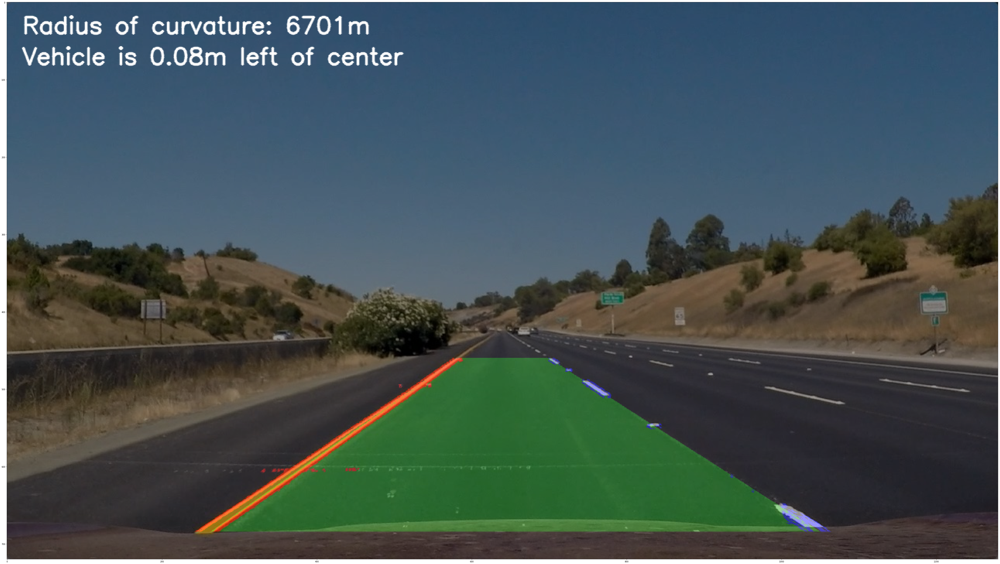

In [45]:
images = glob.glob('./test_images/*.jpg')

img = mpimg.imread(images[0])
imageDetector = AdvancedLaneDetector(usePrior=False)
out_img = imageDetector.process(img)

plt.rcParams['figure.figsize'] = [150, 50]
plt.imshow(out_img)
cv2.imwrite('./output_images/imageProcessed.jpg', cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR))

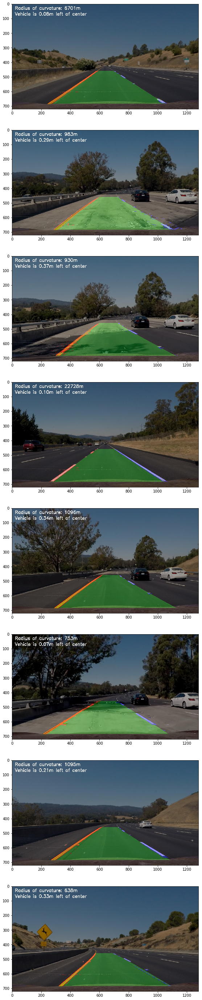

In [46]:
i = 1
for imgName in images:
    img = mpimg.imread(imgName)
    out_img = imageDetector.process(img)
    
    plt.subplot(len(images),1,i)
    plt.imshow(out_img)
    cv2.imwrite('./output_images/imageProcessed'+str(i)+'.jpg', cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR))
    i+=1

In [47]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [48]:
videoDetector = AdvancedLaneDetector(usePrior=True)


clip3 = VideoFileClip('project_video.mp4')#.subclip(39,43)
challenge_clip = clip3.fl_image(videoDetector.process)
%time challenge_clip.write_videofile('project_video_output_prior.mp4', audio=False)

[MoviePy] >>>> Building video project_video_output_prior.mp4
[MoviePy] Writing video project_video_output_prior.mp4


100%|█████████▉| 1260/1261 [06:32<00:00,  3.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_prior.mp4 

CPU times: user 9min 51s, sys: 3.49 s, total: 9min 55s
Wall time: 6min 32s


In [49]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_output_prior.mp4'))